In [50]:
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
from sklearn.linear_model import LinearRegression

from sklearn.metrics import  mean_squared_error,mean_absolute_error
from sklearn.model_selection  import train_test_split
import warnings
warnings.filterwarnings("ignore")

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix,classification_report

# Rainfall Prediction - Weather Forecasting
## Problem Statement:
## Rain Prediction –Weather forecasting

#### Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

#### Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
### 1. Problem Statement: 
#### a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

#### b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.


#### Dataset Description:

#### Number of columns: 23


#### Date  - The date of observation

#### Location  -The common name of the location of the weather station

#### MinTemp  -The minimum temperature in degrees celsius

#### MaxTemp -The maximum temperature in degrees celsius

#### Rainfall  -The amount of rainfall recorded for the day in mm

#### Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

#### Sunshine  -The number of hours of bright sunshine in the day.

#### WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight

#### WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

#### WindDir9am -Direction of the wind at 9am

#### WindDir3pm -Direction of the wind at 3pm

#### WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

#### WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

#### Humidity9am -Humidity (percent) at 9am

#### Humidity3pm -Humidity (percent) at 3pm

#### Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

#### Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

#### Cloud9am - Fraction of sky obscured by cloud at 9am. 

#### Cloud3pm -Fraction of sky obscured by cloud 

#### Temp9am-Temperature (degrees C) at 9am

#### Temp3pm -Temperature (degrees C) at 3pm

#### RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

#### RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".



In [51]:
data =  pd.read_csv("rainfall.csv")
data

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [52]:
data.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

# Checking shape of the data

In [53]:
data.shape

(8425, 23)

#### We have data with 8425 rows and 23 columns

In [54]:
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [55]:
data.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


# Sample data

In [56]:
data.sample(17)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
3539,2009-03-13,Wollongong,20.5,23.7,0.0,NaN,NaN,NNW,35.0,N,...,82.0,79.0,1018.5,1016.5,8.0,7.0,21.7,22.9,No,No
1347,2010-05-24,CoffsHarbour,12.3,19.9,5.0,2.6,0.2,N,28.0,WNW,...,81.0,72.0,1020.0,1016.1,7.0,7.0,17.5,19.1,Yes,No
674,2010-10-06,Albury,11.1,24.9,0.0,NaN,NaN,W,69.0,ESE,...,80.0,52.0,1019.8,1014.4,NaN,NaN,17.4,24.5,No,Yes
4231,2017-04-29,Williamtown,9.0,22.6,0.0,NaN,NaN,WNW,33.0,WNW,...,73.0,55.0,1020.8,1017.8,NaN,NaN,13.9,20.1,No,Yes
4494,2009-06-24,Wollongong,10.2,17.4,0.0,NaN,NaN,WSW,33.0,WSW,...,67.0,58.0,1015.4,1010.6,NaN,NaN,13.6,16.6,No,No
2967,2016-03-13,Williamtown,20.6,30.8,0.0,20.6,8.9,E,43.0,NE,...,64.0,52.0,1020.0,1016.8,5.0,7.0,25.0,29.6,No,No
3204,2016-11-05,Williamtown,12.5,31.5,0.0,NaN,NaN,WNW,76.0,NW,...,32.0,7.0,1003.0,1004.8,NaN,NaN,25.7,28.5,No,No
778,2011-01-18,Albury,12.9,27.2,0.0,NaN,NaN,W,28.0,S,...,64.0,43.0,1007.4,1005.9,NaN,NaN,17.9,25.5,No,No
686,2010-10-18,Albury,9.2,17.4,0.0,NaN,NaN,W,39.0,NW,...,74.0,50.0,1019.9,1019.4,7.0,1.0,12.5,17.1,No,No
6362,2011-09-20,Brisbane,13.6,26.3,0.0,4.4,10.3,NNE,31.0,ENE,...,55.0,57.0,1018.1,1012.7,0.0,8.0,21.9,23.9,No,No


# Checking data types

In [57]:
data.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

# Describing data

In [58]:
data.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,8350.000000,8365.000000,8185.000000,4913.000000,4431.000000,7434.000000,8349.000000,8318.000000,8366.000000,8323.000000,7116.000000,7113.000000,6004.000000,5970.000000,8369.000000,8329.000000
mean,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934
std,5.403596,6.136408,10.459379,5.044484,3.896235,14.665721,10.174579,9.766986,16.833283,18.423774,6.828699,6.766681,2.877658,2.731659,5.627035,5.980020
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.200000,19.300000,0.000000,2.600000,4.750000,30.000000,6.000000,11.000000,56.000000,39.000000,1013.000000,1010.400000,1.000000,2.000000,13.800000,18.000000
50%,13.300000,23.300000,0.000000,4.600000,8.700000,39.000000,13.000000,19.000000,68.000000,51.000000,1017.700000,1015.300000,5.000000,5.000000,17.800000,21.900000
75%,17.400000,28.000000,1.000000,7.000000,10.700000,50.000000,20.000000,24.000000,80.000000,63.000000,1022.300000,1019.800000,7.000000,7.000000,21.900000,26.400000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


# Checking null data

In [59]:
data.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

# Converting date

In [60]:
data['Date']  = pd.to_datetime(data['Date'] , dayfirst=True)

In [61]:
data['Year']=  data['Date'].apply(lambda x:x.year)
data['Month']=  data['Date'].apply(lambda x:x.month)
data['Day']=  data['Date'].apply(lambda x:x.day)

In [62]:
data.drop(["Date"] , axis = 1 , inplace = True)

In [63]:
data

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,1007.1,8.0,NaN,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,1007.8,NaN,NaN,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,1008.7,NaN,2.0,21.0,23.2,No,No,2008,12,3
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,1012.8,NaN,NaN,18.1,26.5,No,No,2008,12,4
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,1006.0,7.0,8.0,17.8,29.7,No,No,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,...,1020.3,NaN,NaN,10.1,22.4,No,No,2017,6,21
8421,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,...,1019.1,NaN,NaN,10.9,24.5,No,No,2017,6,22
8422,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,...,1016.8,NaN,NaN,12.5,26.1,No,No,2017,6,23
8423,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,...,1016.5,3.0,2.0,15.1,26.0,No,No,2017,6,24


In [64]:
data.isnull().sum()

Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
Year                0
Month               0
Day                 0
dtype: int64

In [65]:
from sklearn.impute import SimpleImputer
imp = SimpleImputer(missing_values=np.nan, strategy='mean')
imp_cat = SimpleImputer(missing_values=np.nan, strategy='most_frequent')

In [66]:
data["MinTemp"]  = imp.fit_transform(data["MinTemp"].array.reshape(-1,1))

In [67]:
data["MaxTemp"]  = imp.fit_transform(data["MaxTemp"].array.reshape(-1,1))

In [68]:
data["Rainfall"]  = imp.fit_transform(data["Rainfall"].array.reshape(-1,1))

In [69]:
data["Evaporation"]  = imp.fit_transform(data["Evaporation"].array.reshape(-1,1))

In [70]:
data["Sunshine"]  = imp.fit_transform(data["Sunshine"].array.reshape(-1,1))

In [71]:
data["WindGustDir"]  = imp_cat.fit_transform(data["WindGustDir"].array.reshape(-1,1))

In [72]:
data["WindGustSpeed"]  = imp.fit_transform(data["WindGustSpeed"].array.reshape(-1,1))

In [73]:
data["WindDir9am"]  = imp_cat.fit_transform(data["WindDir9am"].array.reshape(-1,1))

In [74]:
data["WindDir3pm"]  = imp_cat.fit_transform(data["WindDir3pm"].array.reshape(-1,1))

In [75]:
data["WindSpeed9am"]  = imp.fit_transform(data["WindSpeed9am"].array.reshape(-1,1))

In [76]:
data["WindSpeed3pm"]  = imp.fit_transform(data["WindSpeed3pm"].array.reshape(-1,1))

In [77]:
data["Humidity9am"]  = imp.fit_transform(data["Humidity9am"].array.reshape(-1,1))

In [78]:
data["Humidity3pm"]  = imp.fit_transform(data["Humidity3pm"].array.reshape(-1,1))

In [79]:
data["Pressure9am"]  = imp.fit_transform(data["Pressure9am"].array.reshape(-1,1))

In [80]:
data["Pressure3pm"]  = imp.fit_transform(data["Pressure3pm"].array.reshape(-1,1))

In [81]:
data["Cloud9am"]  = imp.fit_transform(data["Cloud9am"].array.reshape(-1,1))

In [82]:
data["Cloud3pm"]  = imp.fit_transform(data["Cloud3pm"].array.reshape(-1,1))

In [83]:
data["Temp9am"]  = imp.fit_transform(data["Temp9am"].array.reshape(-1,1))

In [84]:
data["Temp3pm"]  = imp.fit_transform(data["Temp3pm"].array.reshape(-1,1))

In [85]:
data["RainToday"]  = imp_cat.fit_transform(data["RainToday"].array.reshape(-1,1))

In [86]:
data["RainTomorrow"]  = imp_cat.fit_transform(data["RainTomorrow"].array.reshape(-1,1))

In [87]:
data

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,Albury,13.4,22.900000,0.6,5.389395,7.632205,W,44.000000,W,WNW,...,1007.1,8.000000,4.503183,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.100000,0.0,5.389395,7.632205,WNW,44.000000,NNW,WSW,...,1007.8,4.566622,4.503183,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.700000,0.0,5.389395,7.632205,WSW,46.000000,W,WSW,...,1008.7,4.566622,2.000000,21.0,23.2,No,No,2008,12,3
3,Albury,9.2,28.000000,0.0,5.389395,7.632205,NE,24.000000,SE,E,...,1012.8,4.566622,4.503183,18.1,26.5,No,No,2008,12,4
4,Albury,17.5,32.300000,1.0,5.389395,7.632205,W,41.000000,ENE,NW,...,1006.0,7.000000,8.000000,17.8,29.7,No,No,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.400000,0.0,5.389395,7.632205,E,31.000000,SE,ENE,...,1020.3,4.566622,4.503183,10.1,22.4,No,No,2017,6,21
8421,Uluru,3.6,25.300000,0.0,5.389395,7.632205,NNW,22.000000,SE,N,...,1019.1,4.566622,4.503183,10.9,24.5,No,No,2017,6,22
8422,Uluru,5.4,26.900000,0.0,5.389395,7.632205,N,37.000000,SE,WNW,...,1016.8,4.566622,4.503183,12.5,26.1,No,No,2017,6,23
8423,Uluru,7.8,27.000000,0.0,5.389395,7.632205,SE,28.000000,SSE,N,...,1016.5,3.000000,2.000000,15.1,26.0,No,No,2017,6,24


In [88]:
data.isnull().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Year             0
Month            0
Day              0
dtype: int64

# Encoding the data

In [89]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OrdinalEncoder

In [90]:
le = LabelEncoder()
oe = OrdinalEncoder()
data["RainTomorrow"] = le.fit_transform(data["RainTomorrow"])

In [91]:
for i in data.columns:
    if data[i].dtypes == "object":
        data[i] = oe.fit_transform(data[i].values.reshape(-1,1))

In [92]:
data

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,1.0,13.4,22.900000,0.6,5.389395,7.632205,13.0,44.000000,13.0,14.0,...,1007.1,8.000000,4.503183,16.9,21.8,0.0,0,2008,12,1
1,1.0,7.4,25.100000,0.0,5.389395,7.632205,14.0,44.000000,6.0,15.0,...,1007.8,4.566622,4.503183,17.2,24.3,0.0,0,2008,12,2
2,1.0,12.9,25.700000,0.0,5.389395,7.632205,15.0,46.000000,13.0,15.0,...,1008.7,4.566622,2.000000,21.0,23.2,0.0,0,2008,12,3
3,1.0,9.2,28.000000,0.0,5.389395,7.632205,4.0,24.000000,9.0,0.0,...,1012.8,4.566622,4.503183,18.1,26.5,0.0,0,2008,12,4
4,1.0,17.5,32.300000,1.0,5.389395,7.632205,13.0,41.000000,1.0,7.0,...,1006.0,7.000000,8.000000,17.8,29.7,0.0,0,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9.0,2.8,23.400000,0.0,5.389395,7.632205,0.0,31.000000,9.0,1.0,...,1020.3,4.566622,4.503183,10.1,22.4,0.0,0,2017,6,21
8421,9.0,3.6,25.300000,0.0,5.389395,7.632205,6.0,22.000000,9.0,3.0,...,1019.1,4.566622,4.503183,10.9,24.5,0.0,0,2017,6,22
8422,9.0,5.4,26.900000,0.0,5.389395,7.632205,3.0,37.000000,9.0,14.0,...,1016.8,4.566622,4.503183,12.5,26.1,0.0,0,2017,6,23
8423,9.0,7.8,27.000000,0.0,5.389395,7.632205,9.0,28.000000,10.0,3.0,...,1016.5,3.000000,2.000000,15.1,26.0,0.0,0,2017,6,24


# Checking the correlation of the data

In [93]:
corr = data.corr()
corr

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
Location,1.000000,0.116531,0.064268,0.007693,0.143519,0.057817,-0.035408,0.231396,-0.027103,-0.027736,...,-0.020574,0.038019,0.017561,0.118051,0.060570,0.003071,0.002824,0.486405,-0.082407,-0.002019
MinTemp,0.116531,1.000000,0.717522,0.087684,0.254965,0.056184,-0.145316,0.230058,-0.041650,-0.147166,...,-0.422991,0.091604,0.038414,0.887119,0.685520,0.064789,0.092942,0.044123,-0.245854,0.009446
MaxTemp,0.064268,0.717522,1.000000,-0.087451,0.322405,0.378403,-0.224670,0.139998,-0.214119,-0.180622,...,-0.403258,-0.253968,-0.250132,0.866039,0.974506,-0.224883,-0.152886,0.119772,-0.163253,0.015608
Rainfall,0.007693,0.087684,-0.087451,1.000000,0.023517,-0.169432,0.038812,0.086000,0.093821,0.038560,...,-0.033649,0.185444,0.150760,-0.007083,-0.090687,0.461106,0.220021,0.006435,-0.012244,-0.013760
Evaporation,0.143519,0.254965,0.322405,0.023517,1.000000,0.226001,-0.078765,0.136371,-0.061677,-0.047952,...,-0.189558,-0.062283,-0.108022,0.305264,0.315109,-0.088654,-0.059012,0.152708,0.004362,0.013597
Sunshine,0.057817,0.056184,0.378403,-0.169432,0.226001,1.000000,-0.105918,-0.013778,-0.076560,-0.068553,...,-0.035863,-0.533391,-0.547304,0.250640,0.395324,-0.234230,-0.327731,0.065374,-0.006694,0.004662
WindGustDir,-0.035408,-0.145316,-0.224670,0.038812,-0.078765,-0.105918,1.000000,0.016591,0.403562,0.505799,...,-0.024997,0.123883,0.092979,-0.176318,-0.238856,0.125188,0.051832,-0.088340,0.034823,0.015683
WindGustSpeed,0.231396,0.230058,0.139998,0.086000,0.136371,-0.013778,0.016591,1.000000,-0.072058,0.071235,...,-0.372651,0.023313,0.078631,0.202298,0.102199,0.076822,0.190127,-0.042402,0.051968,-0.002876
WindDir9am,-0.027103,-0.041650,-0.214119,0.093821,-0.061677,-0.076560,0.403562,-0.072058,1.000000,0.249527,...,0.073446,0.099582,0.062947,-0.103111,-0.221634,0.157324,0.032860,-0.014498,0.012544,-0.015154
WindDir3pm,-0.027736,-0.147166,-0.180622,0.038560,-0.047952,-0.068553,0.505799,0.071235,0.249527,1.000000,...,-0.043681,0.075453,0.053986,-0.165072,-0.194463,0.100125,0.008918,-0.005812,0.029384,0.003089


<AxesSubplot:>

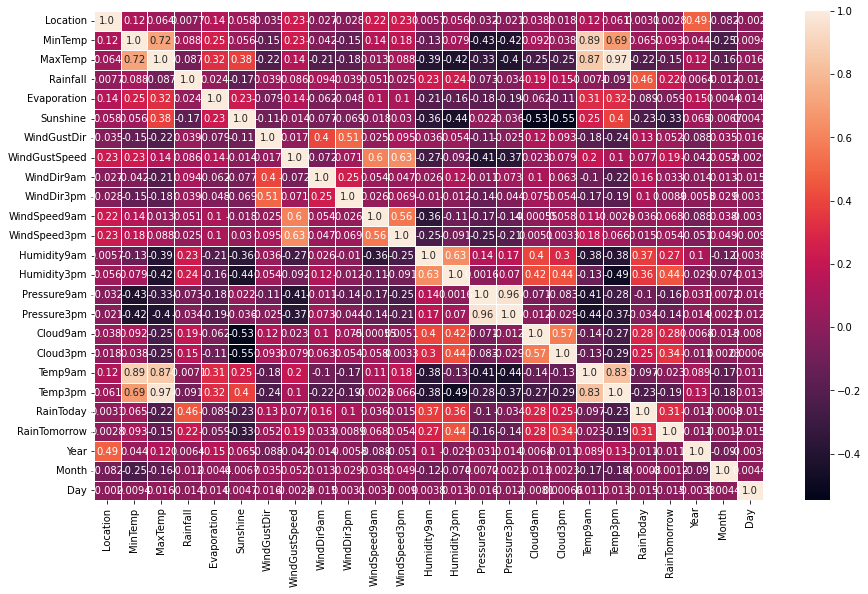

In [94]:
plt.figure(figsize =  (15,9))
sns.heatmap(corr,annot = True,linewidth = 0.5 ,linecolor = "white", fmt ='0.2')

# Univariate analysis

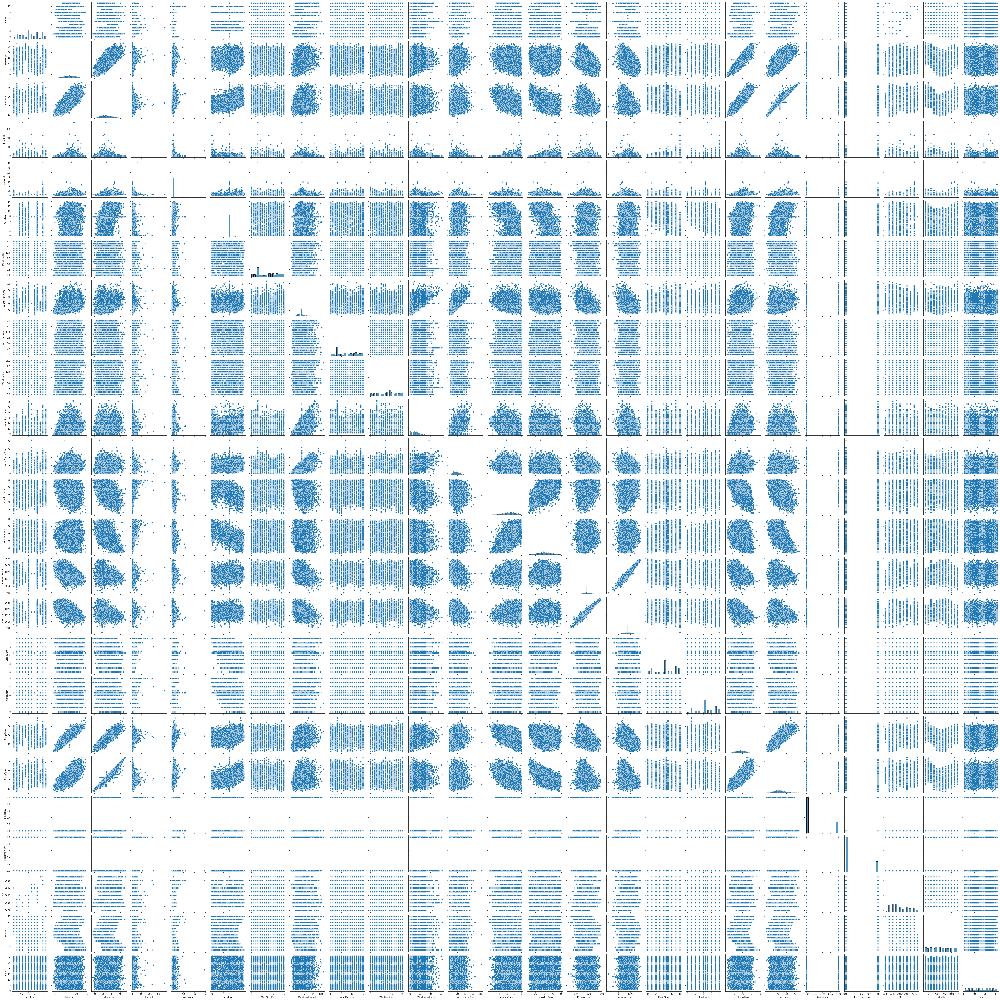

In [95]:
sns.pairplot(data)

5.0     1622
10.0    1230
8.0     1204
1.0      907
6.0      822
3.0      611
2.0      579
7.0      482
11.0     474
4.0      250
0.0      205
9.0       39
Name: Location, dtype: int64

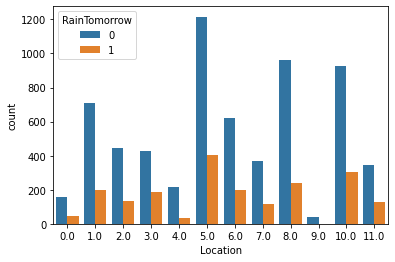

In [96]:
sns.countplot(data["Location"] , hue = "RainTomorrow" , data = data)
data["Location"].value_counts()

In [97]:
data.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Year', 'Month', 'Day'],
      dtype='object')

 13.193305    75
 12.000000    74
 13.200000    71
 13.800000    69
 12.700000    68
              ..
-1.100000      1
 1.400000      1
-1.400000      1
-1.700000      1
 26.000000     1
Name: MinTemp, Length: 286, dtype: int64

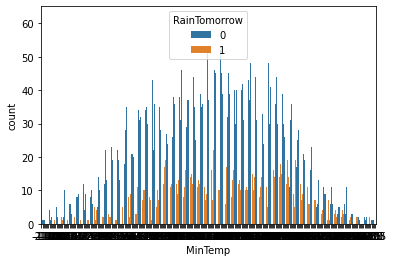

In [98]:
sns.countplot(data["MinTemp"] , hue = "RainTomorrow" , data = data)
data["MinTemp"].value_counts()

19.0    87
23.8    75
19.8    74
25.0    71
22.3    68
        ..
8.2      1
10.3     1
39.7     1
9.4      1
43.5     1
Name: MaxTemp, Length: 332, dtype: int64

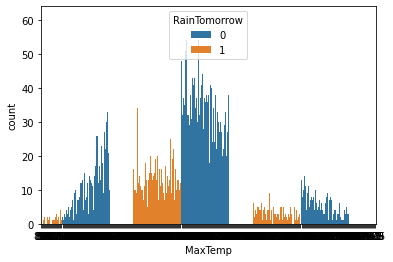

In [99]:
sns.countplot(data["MaxTemp"] , hue = "RainTomorrow" , data = data)
data["MaxTemp"].value_counts()

0.000000      5299
0.200000       406
2.805913       240
0.400000       177
0.600000       116
              ... 
61.200000        1
128.000000       1
90.000000        1
34.400000        1
40.000000        1
Name: Rainfall, Length: 251, dtype: int64

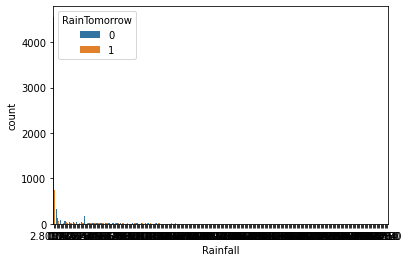

In [100]:
sns.countplot(data["Rainfall"] , hue = "RainTomorrow" , data = data)
data["Rainfall"].value_counts()

5.389395     3512
4.000000      180
3.000000      163
2.400000      147
2.200000      146
             ... 
17.000000       1
14.000000       1
15.000000       1
15.600000       1
0.700000        1
Name: Evaporation, Length: 117, dtype: int64

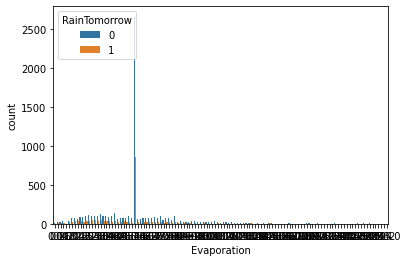

In [101]:
sns.countplot(data["Evaporation"] , hue = "RainTomorrow" , data = data)
data["Evaporation"].value_counts()

7.632205     3994
0.000000      166
11.100000      68
11.200000      67
11.000000      66
             ... 
2.500000        8
13.600000       7
13.800000       4
13.900000       3
13.500000       2
Name: Sunshine, Length: 141, dtype: int64

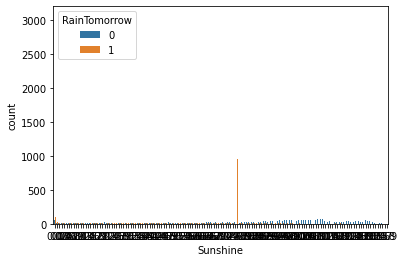

In [102]:
sns.countplot(data["Sunshine"] , hue = "RainTomorrow" , data = data)
data["Sunshine"].value_counts()

3.0     1704
10.0     578
8.0      577
12.0     572
0.0      557
14.0     531
13.0     507
15.0     504
9.0      484
1.0      415
11.0     396
7.0      383
4.0      353
5.0      343
2.0      302
6.0      219
Name: WindGustDir, dtype: int64

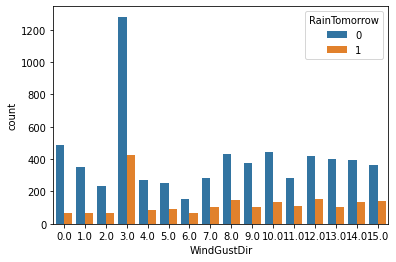

In [103]:
sns.countplot(data["WindGustDir"] , hue = "RainTomorrow" , data = data)
data["WindGustDir"].value_counts()

40.174469     991
39.000000     441
35.000000     435
37.000000     422
33.000000     408
31.000000     396
41.000000     371
30.000000     367
28.000000     332
43.000000     302
48.000000     292
26.000000     275
50.000000     259
46.000000     258
24.000000     255
52.000000     249
44.000000     241
22.000000     223
54.000000     210
20.000000     186
56.000000     153
57.000000     148
19.000000     137
61.000000     114
59.000000     113
63.000000      95
17.000000      92
65.000000      74
67.000000      64
72.000000      62
15.000000      58
13.000000      57
74.000000      54
70.000000      53
69.000000      49
76.000000      44
78.000000      23
80.000000      22
11.000000      18
85.000000      14
81.000000      13
91.000000      12
89.000000       7
93.000000       7
9.000000        6
83.000000       6
98.000000       4
94.000000       3
87.000000       3
102.000000      2
100.000000      2
7.000000        2
107.000000      1
Name: WindGustSpeed, dtype: int64

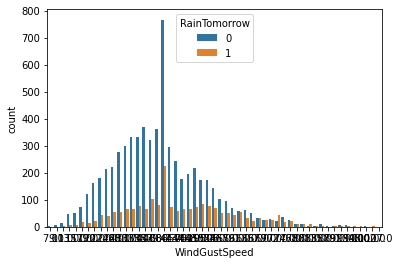

In [104]:
sns.countplot(data["WindGustSpeed"] , hue = "RainTomorrow" , data = data)
data["WindGustSpeed"].value_counts()

3.0     1735
12.0     704
7.0      625
15.0     543
9.0      505
14.0     480
11.0     467
1.0      433
5.0      430
13.0     414
4.0      409
8.0      402
0.0      380
10.0     365
6.0      280
2.0      253
Name: WindDir9am, dtype: int64

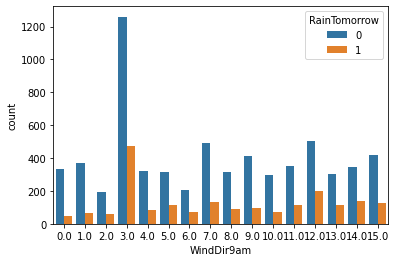

In [105]:
sns.countplot(data["WindDir9am"] , hue = "RainTomorrow" , data = data)
data["WindDir9am"].value_counts()

9.0     1121
8.0      742
10.0     623
15.0     580
4.0      544
3.0      524
12.0     494
14.0     487
7.0      468
13.0     462
2.0      462
0.0      460
1.0      417
11.0     370
5.0      365
6.0      306
Name: WindDir3pm, dtype: int64

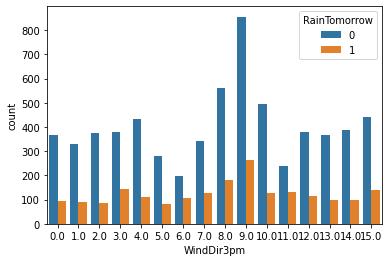

In [106]:
sns.countplot(data["WindDir3pm"] , hue = "RainTomorrow" , data = data)
data["WindDir3pm"].value_counts()

9.000000     803
0.000000     752
13.000000    708
4.000000     610
11.000000    607
7.000000     572
6.000000     515
17.000000    481
15.000000    467
19.000000    430
20.000000    427
24.000000    312
22.000000    279
2.000000     258
28.000000    229
26.000000    208
31.000000    153
30.000000    114
35.000000     77
13.847646     76
33.000000     70
37.000000     58
41.000000     49
39.000000     35
44.000000     29
43.000000     28
46.000000     26
52.000000     16
50.000000     10
56.000000      8
54.000000      6
48.000000      6
61.000000      2
57.000000      2
63.000000      2
Name: WindSpeed9am, dtype: int64

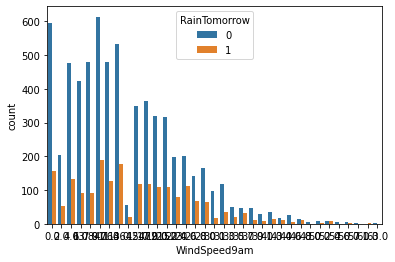

In [107]:
sns.countplot(data["WindSpeed9am"] , hue = "RainTomorrow" , data = data)
data["WindSpeed9am"].value_counts()

9.000000     724
19.000000    639
13.000000    599
20.000000    594
17.000000    555
11.000000    534
15.000000    524
24.000000    511
28.000000    458
22.000000    457
26.000000    378
7.000000     331
4.000000     287
30.000000    279
31.000000    266
6.000000     240
0.000000     199
33.000000    170
35.000000    137
37.000000    125
18.533662    107
39.000000     80
2.000000      58
41.000000     45
43.000000     34
46.000000     29
44.000000     18
50.000000     12
48.000000     11
52.000000      9
56.000000      7
54.000000      2
61.000000      2
57.000000      2
65.000000      1
83.000000      1
Name: WindSpeed3pm, dtype: int64

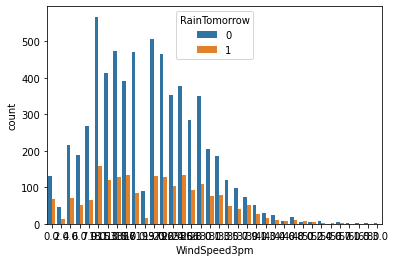

In [108]:
sns.countplot(data["WindSpeed3pm"] , hue = "RainTomorrow" , data = data)
data["WindSpeed3pm"].value_counts()

73.0    205
62.0    202
68.0    199
74.0    195
70.0    188
       ... 
17.0      2
14.0      2
11.0      2
10.0      1
15.0      1
Name: Humidity9am, Length: 91, dtype: int64

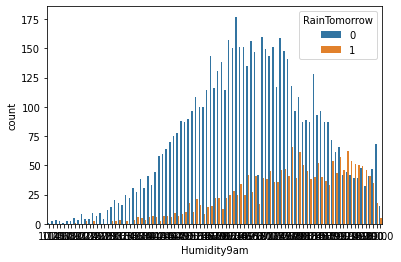

In [109]:
sns.countplot(data["Humidity9am"] , hue = "RainTomorrow" , data = data)
data["Humidity9am"].value_counts()

55.0    195
51.0    194
48.0    194
54.0    193
46.0    193
       ... 
8.0      11
7.0       9
98.0      7
99.0      3
6.0       3
Name: Humidity3pm, Length: 95, dtype: int64

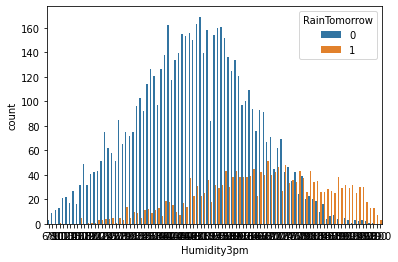

In [110]:
sns.countplot(data["Humidity3pm"] , hue = "RainTomorrow" , data = data)
data["Humidity3pm"].value_counts()

1017.640233    1309
1014.800000      58
1019.200000      55
1016.100000      54
1019.600000      53
               ... 
1037.300000       1
997.800000        1
1036.900000       1
1036.300000       1
1033.600000       1
Name: Pressure9am, Length: 385, dtype: int64

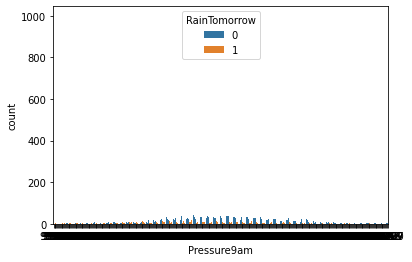

In [111]:
sns.countplot(data["Pressure9am"] , hue = "RainTomorrow" , data = data)
data["Pressure9am"].value_counts()

1015.236075    1312
1017.800000      60
1018.000000      57
1017.900000      53
1019.800000      53
               ... 
982.900000        1
994.300000        1
998.900000        1
1030.000000       1
1029.500000       1
Name: Pressure3pm, Length: 375, dtype: int64

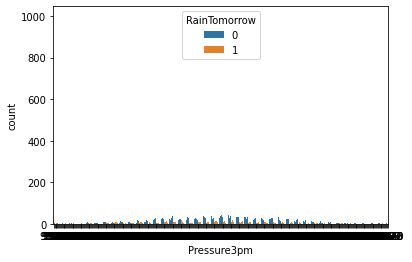

In [112]:
sns.countplot(data["Pressure3pm"] , hue = "RainTomorrow" , data = data)
data["Pressure3pm"].value_counts()

4.566622    2421
7.000000    1418
1.000000    1038
8.000000    1015
0.000000     554
6.000000     551
5.000000     414
3.000000     384
2.000000     357
4.000000     273
Name: Cloud9am, dtype: int64

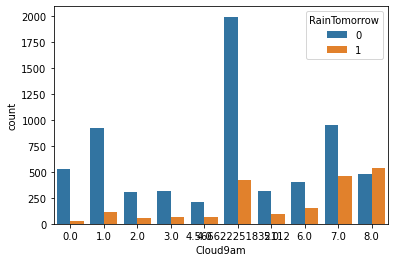

In [113]:
sns.countplot(data["Cloud9am"] , hue = "RainTomorrow" , data = data)
data["Cloud9am"].value_counts()

4.503183    2455
7.000000    1294
1.000000    1077
8.000000     863
6.000000     597
5.000000     522
2.000000     508
3.000000     411
4.000000     351
0.000000     347
Name: Cloud3pm, dtype: int64

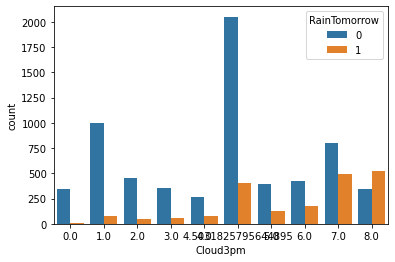

In [114]:
sns.countplot(data["Cloud3pm"] , hue = "RainTomorrow" , data = data)
data["Cloud3pm"].value_counts()

14.8    77
18.0    73
18.3    71
17.5    69
20.6    68
        ..
2.5      1
2.0      1
3.4      1
5.2      1
30.2     1
Name: Temp9am, Length: 305, dtype: int64

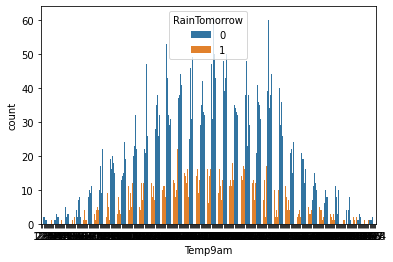

In [115]:
sns.countplot(data["Temp9am"] , hue = "RainTomorrow" , data = data)
data["Temp9am"].value_counts()

22.442934    96
19.200000    78
22.500000    77
19.000000    75
21.700000    72
             ..
8.700000      1
37.400000     1
36.700000     1
8.600000      1
42.400000     1
Name: Temp3pm, Length: 329, dtype: int64

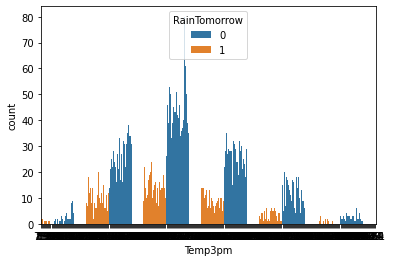

In [116]:
sns.countplot(data["Temp3pm"] , hue = "RainTomorrow" , data = data)
data["Temp3pm"].value_counts()

0.0    6435
1.0    1990
Name: RainToday, dtype: int64

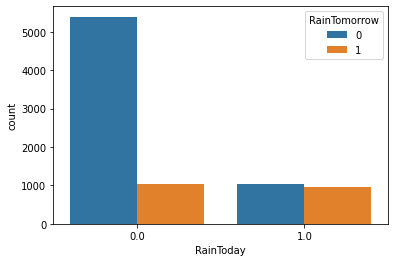

In [117]:
sns.countplot(data["RainToday"] , hue = "RainTomorrow" , data = data)
data["RainToday"].value_counts()

2011    1468
2010    1443
2009    1238
2014     959
2012     905
2016     732
2015     653
2013     543
2017     391
2008      93
Name: Year, dtype: int64

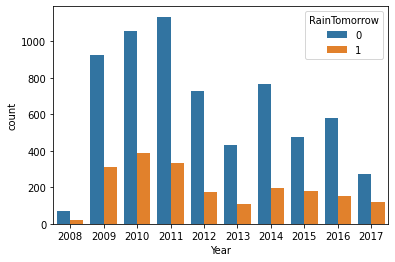

In [118]:
sns.countplot(data["Year"] , hue = "RainTomorrow" , data = data)
data["Year"].value_counts()

6     818
5     801
3     761
1     753
12    741
7     732
8     682
10    655
11    653
2     620
9     609
4     600
Name: Month, dtype: int64

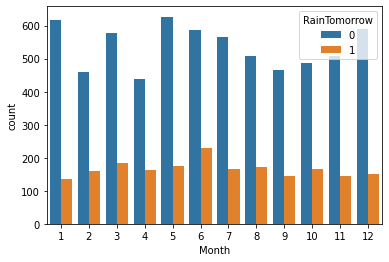

In [119]:
sns.countplot(data["Month"] , hue = "RainTomorrow" , data = data)
data["Month"].value_counts()

21    280
20    280
25    280
24    280
23    280
22    280
10    278
12    278
11    278
9     277
8     277
7     277
13    277
18    277
19    277
14    276
15    276
6     276
17    276
16    276
28    275
1     275
2     275
5     275
4     275
3     275
26    274
27    274
29    256
30    250
31    165
Name: Day, dtype: int64

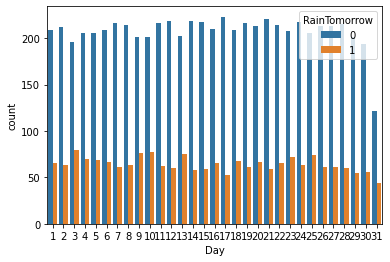

In [120]:
sns.countplot(data["Day"] , hue = "RainTomorrow" , data = data)
data["Day"].value_counts()

In [121]:
data.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Year', 'Month', 'Day'],
      dtype='object')

<AxesSubplot:xlabel='Location', ylabel='Count'>

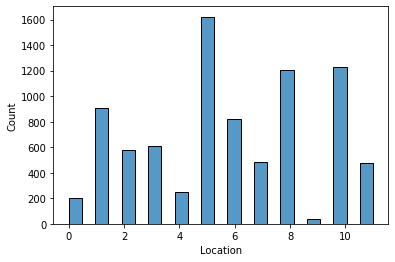

In [122]:
sns.histplot(data["Location"])

<AxesSubplot:xlabel='MinTemp', ylabel='Count'>

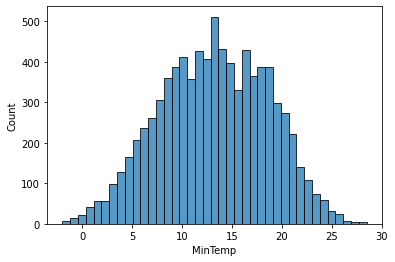

In [123]:
sns.histplot(data["MinTemp"])

<AxesSubplot:xlabel='MaxTemp', ylabel='Count'>

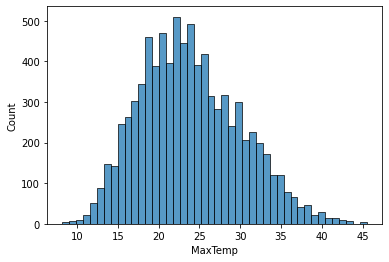

In [124]:
sns.histplot(data["MaxTemp"])

<AxesSubplot:xlabel='Rainfall', ylabel='Count'>

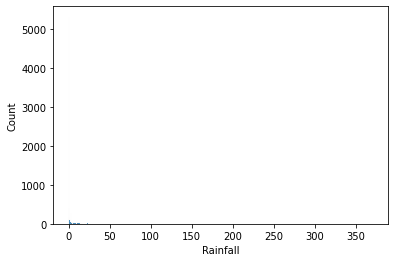

In [125]:
sns.histplot(data["Rainfall"])

<AxesSubplot:xlabel='Evaporation', ylabel='Count'>

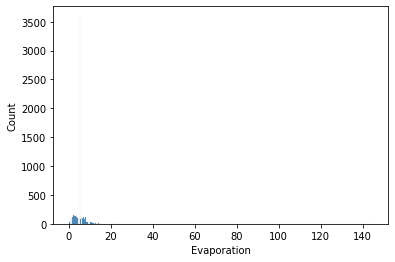

In [126]:
sns.histplot(data["Evaporation"])

<AxesSubplot:xlabel='Sunshine', ylabel='Count'>

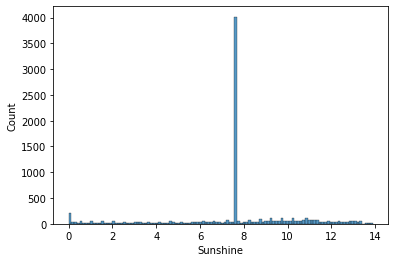

In [127]:
sns.histplot(data["Sunshine"])

<AxesSubplot:xlabel='WindGustDir', ylabel='Count'>

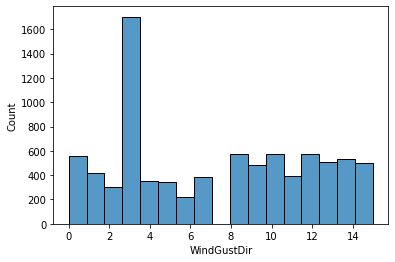

In [128]:
sns.histplot(data["WindGustDir"])

<AxesSubplot:xlabel='WindGustSpeed', ylabel='Count'>

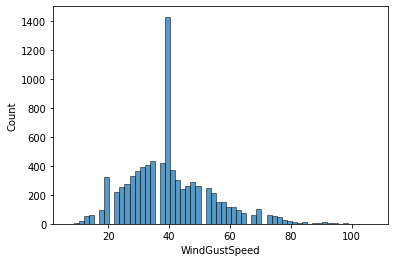

In [129]:
sns.histplot(data["WindGustSpeed"])

<AxesSubplot:xlabel='WindDir9am', ylabel='Count'>

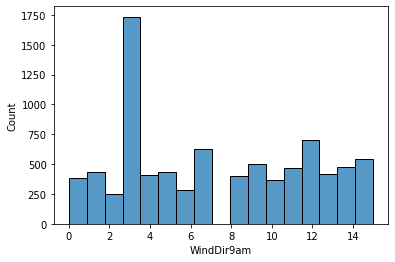

In [130]:
sns.histplot(data["WindDir9am"])

<AxesSubplot:xlabel='WindDir3pm', ylabel='Count'>

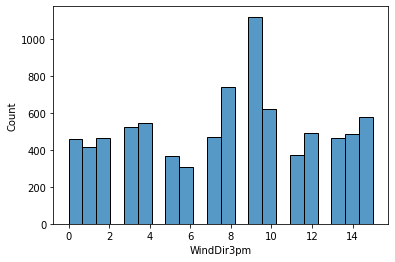

In [131]:
sns.histplot(data["WindDir3pm"])

<AxesSubplot:xlabel='WindSpeed9am', ylabel='Count'>

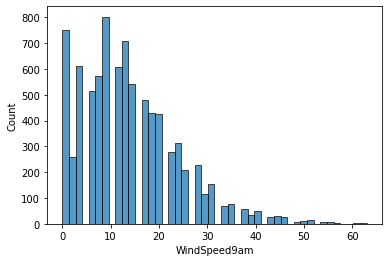

In [132]:
sns.histplot(data["WindSpeed9am"])

<AxesSubplot:xlabel='WindSpeed3pm', ylabel='Count'>

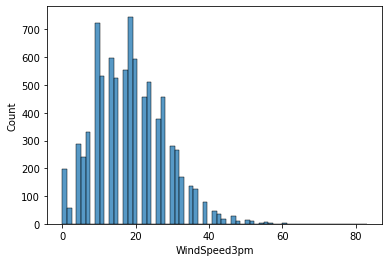

In [133]:
sns.histplot(data["WindSpeed3pm"])

<AxesSubplot:xlabel='Humidity9am', ylabel='Count'>

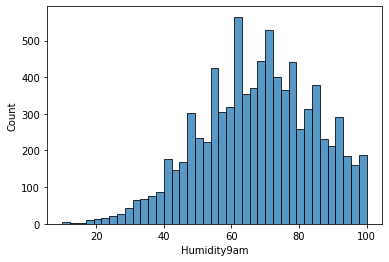

In [134]:
sns.histplot(data["Humidity9am"])

<AxesSubplot:xlabel='Humidity3pm', ylabel='Count'>

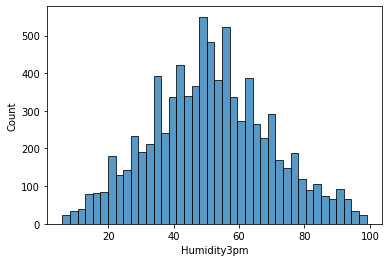

In [135]:
sns.histplot(data["Humidity3pm"])

<AxesSubplot:xlabel='Pressure9am', ylabel='Count'>

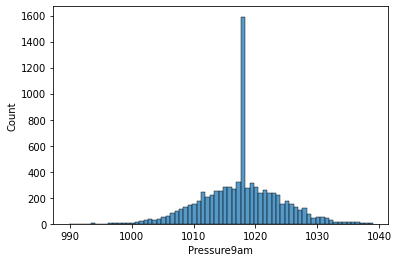

In [136]:
sns.histplot(data["Pressure9am"])

<AxesSubplot:xlabel='Pressure3pm', ylabel='Count'>

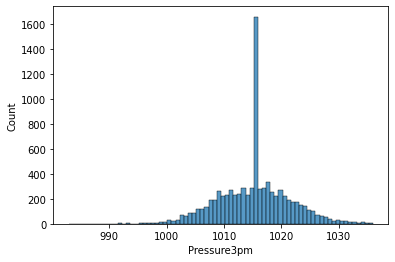

In [137]:
sns.histplot(data["Pressure3pm"])

<AxesSubplot:xlabel='Cloud9am', ylabel='Count'>

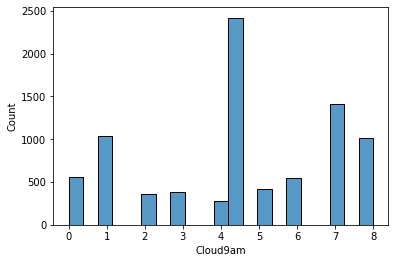

In [138]:
sns.histplot(data["Cloud9am"])

<AxesSubplot:xlabel='Cloud3pm', ylabel='Count'>

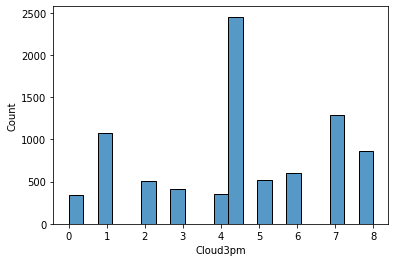

In [139]:
sns.histplot(data["Cloud3pm"])

<AxesSubplot:xlabel='Temp9am', ylabel='Count'>

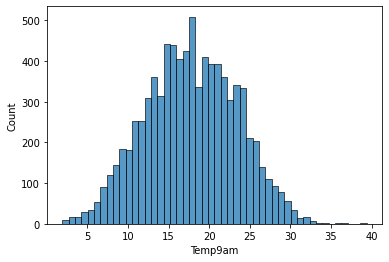

In [140]:
sns.histplot(data["Temp9am"])

<AxesSubplot:xlabel='Temp3pm', ylabel='Count'>

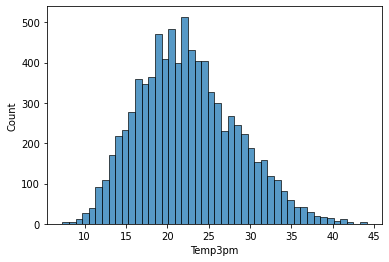

In [141]:
sns.histplot(data["Temp3pm"])

<AxesSubplot:xlabel='RainToday', ylabel='Count'>

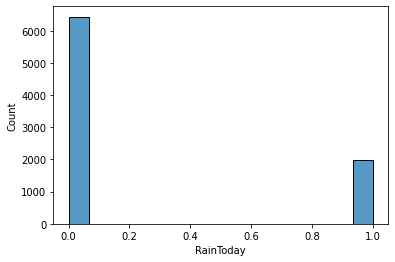

In [142]:
sns.histplot(data["RainToday"])

<AxesSubplot:xlabel='Year', ylabel='Count'>

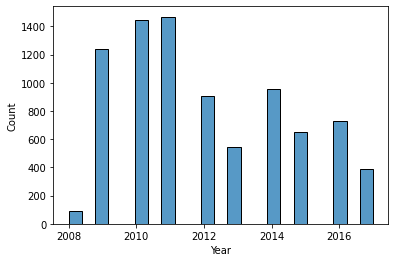

In [143]:
sns.histplot(data["Year"])

<AxesSubplot:xlabel='Month', ylabel='Count'>

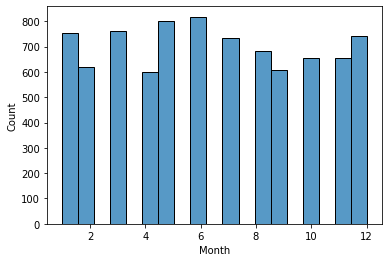

In [144]:
sns.histplot(data["Month"])

<AxesSubplot:xlabel='Day', ylabel='Count'>

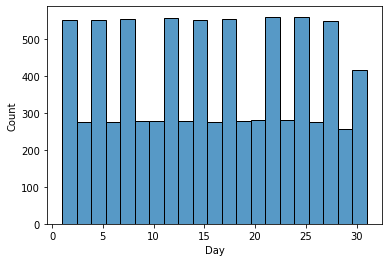

In [145]:
sns.histplot(data["Day"])

# Bivariate analysis

<AxesSubplot:xlabel='Location', ylabel='RainTomorrow'>

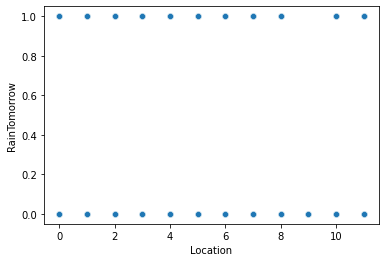

In [146]:
sns.scatterplot("Location", "RainTomorrow", data=data)

<AxesSubplot:xlabel='MinTemp', ylabel='RainTomorrow'>

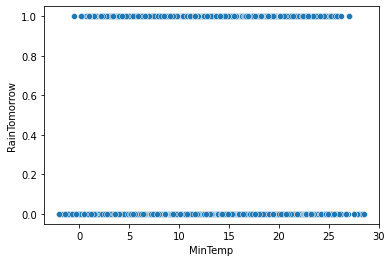

In [147]:
sns.scatterplot("MinTemp", "RainTomorrow", data=data)

<AxesSubplot:xlabel='MaxTemp', ylabel='RainTomorrow'>

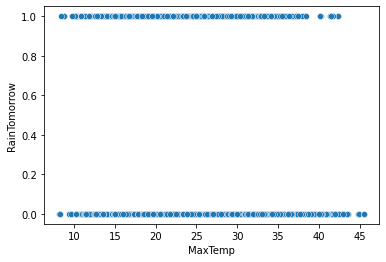

In [148]:
sns.scatterplot("MaxTemp", "RainTomorrow", data=data)

<AxesSubplot:xlabel='Rainfall', ylabel='RainTomorrow'>

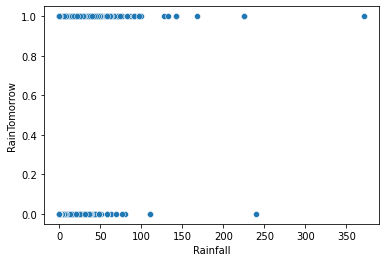

In [149]:
sns.scatterplot("Rainfall", "RainTomorrow", data=data)

<AxesSubplot:xlabel='Evaporation', ylabel='RainTomorrow'>

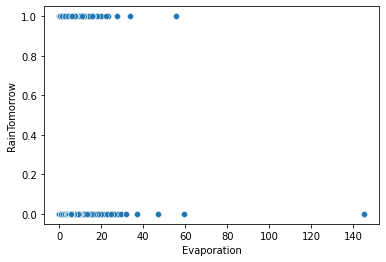

In [150]:
sns.scatterplot("Evaporation", "RainTomorrow", data=data)

<AxesSubplot:xlabel='Sunshine', ylabel='RainTomorrow'>

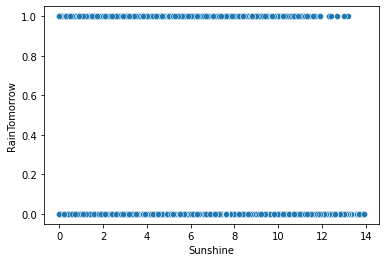

In [151]:
sns.scatterplot("Sunshine", "RainTomorrow", data=data)

<AxesSubplot:xlabel='WindGustDir', ylabel='RainTomorrow'>

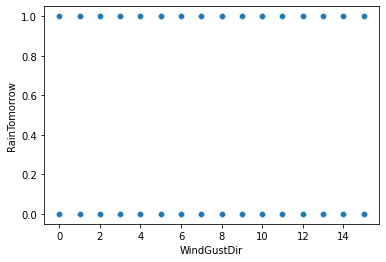

In [152]:
sns.scatterplot("WindGustDir", "RainTomorrow", data=data)

<AxesSubplot:xlabel='WindGustSpeed', ylabel='RainTomorrow'>

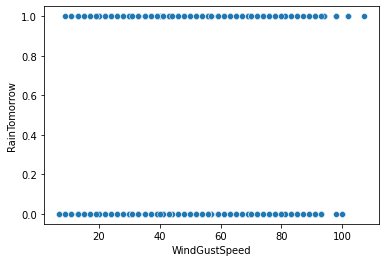

In [153]:
sns.scatterplot("WindGustSpeed", "RainTomorrow", data=data)

<AxesSubplot:xlabel='WindDir9am', ylabel='RainTomorrow'>

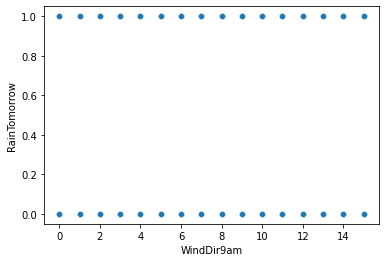

In [154]:
sns.scatterplot("WindDir9am", "RainTomorrow", data=data)

<AxesSubplot:xlabel='WindDir3pm', ylabel='RainTomorrow'>

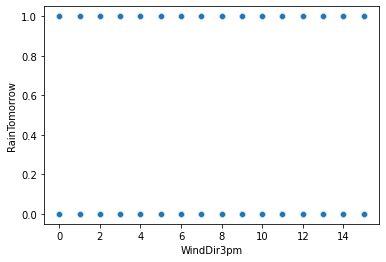

In [155]:
sns.scatterplot("WindDir3pm", "RainTomorrow", data=data)

<AxesSubplot:xlabel='WindSpeed9am', ylabel='RainTomorrow'>

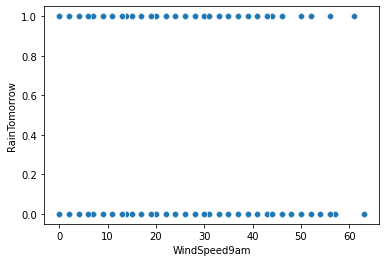

In [156]:
sns.scatterplot("WindSpeed9am", "RainTomorrow", data=data)

<AxesSubplot:xlabel='WindSpeed3pm', ylabel='RainTomorrow'>

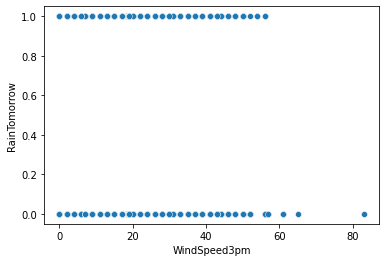

In [157]:
sns.scatterplot("WindSpeed3pm", "RainTomorrow", data=data)

<AxesSubplot:xlabel='Humidity9am', ylabel='RainTomorrow'>

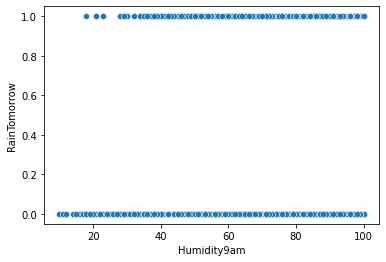

In [158]:
sns.scatterplot("Humidity9am", "RainTomorrow", data=data)

<AxesSubplot:xlabel='Humidity3pm', ylabel='RainTomorrow'>

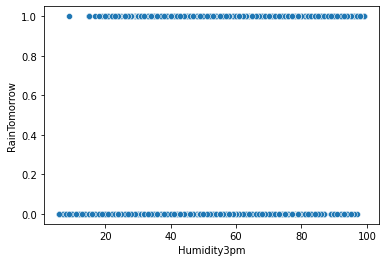

In [159]:
sns.scatterplot("Humidity3pm", "RainTomorrow", data=data)

<AxesSubplot:xlabel='Pressure9am', ylabel='RainTomorrow'>

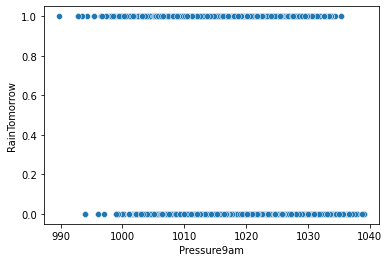

In [160]:
sns.scatterplot("Pressure9am", "RainTomorrow", data=data)

<AxesSubplot:xlabel='Pressure3pm', ylabel='RainTomorrow'>

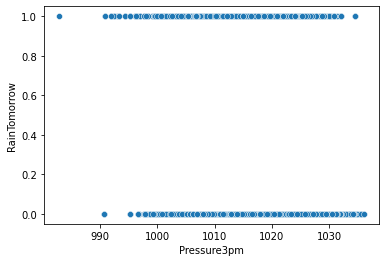

In [161]:
sns.scatterplot("Pressure3pm", "RainTomorrow", data=data)

<AxesSubplot:xlabel='Cloud9am', ylabel='RainTomorrow'>

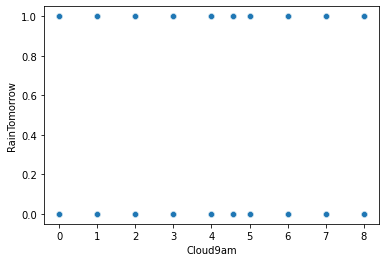

In [162]:
sns.scatterplot("Cloud9am", "RainTomorrow", data=data)

<AxesSubplot:xlabel='Cloud3pm', ylabel='RainTomorrow'>

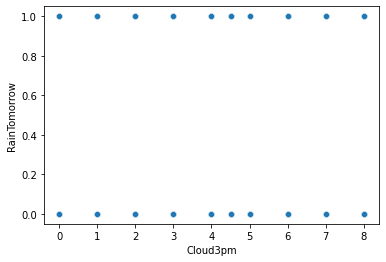

In [163]:
sns.scatterplot("Cloud3pm", "RainTomorrow", data=data)

<AxesSubplot:xlabel='Temp9am', ylabel='RainTomorrow'>

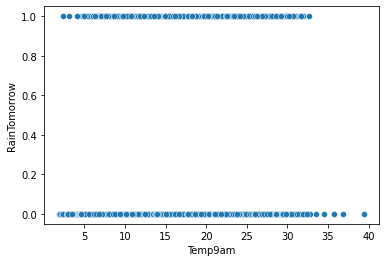

In [164]:
sns.scatterplot("Temp9am", "RainTomorrow", data=data)

<AxesSubplot:xlabel='Temp3pm', ylabel='RainTomorrow'>

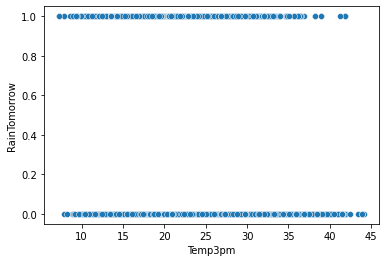

In [165]:
sns.scatterplot("Temp3pm", "RainTomorrow", data=data)

<AxesSubplot:xlabel='RainToday', ylabel='RainTomorrow'>

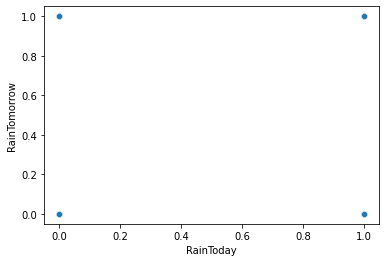

In [166]:
sns.scatterplot("RainToday", "RainTomorrow", data=data)

<AxesSubplot:xlabel='Year', ylabel='RainTomorrow'>

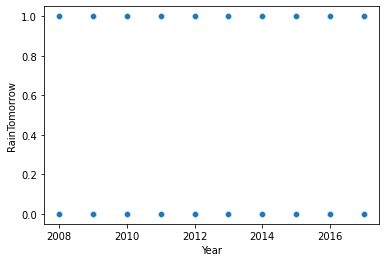

In [167]:
sns.scatterplot("Year", "RainTomorrow", data=data)

<AxesSubplot:xlabel='Month', ylabel='RainTomorrow'>

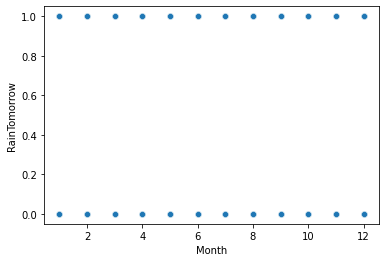

In [168]:
sns.scatterplot("Month", "RainTomorrow", data=data)

<AxesSubplot:xlabel='Day', ylabel='RainTomorrow'>

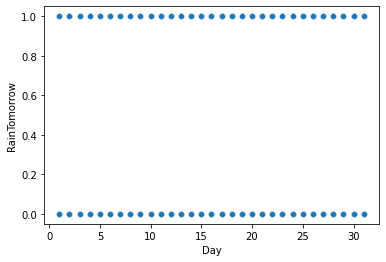

In [169]:
sns.scatterplot("Day", "RainTomorrow", data=data)

In [172]:
data

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,1.0,13.4,22.900000,0.6,5.389395,7.632205,13.0,44.000000,13.0,14.0,...,1007.1,8.000000,4.503183,16.9,21.8,0.0,0,2008,12,1
1,1.0,7.4,25.100000,0.0,5.389395,7.632205,14.0,44.000000,6.0,15.0,...,1007.8,4.566622,4.503183,17.2,24.3,0.0,0,2008,12,2
2,1.0,12.9,25.700000,0.0,5.389395,7.632205,15.0,46.000000,13.0,15.0,...,1008.7,4.566622,2.000000,21.0,23.2,0.0,0,2008,12,3
3,1.0,9.2,28.000000,0.0,5.389395,7.632205,4.0,24.000000,9.0,0.0,...,1012.8,4.566622,4.503183,18.1,26.5,0.0,0,2008,12,4
4,1.0,17.5,32.300000,1.0,5.389395,7.632205,13.0,41.000000,1.0,7.0,...,1006.0,7.000000,8.000000,17.8,29.7,0.0,0,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9.0,2.8,23.400000,0.0,5.389395,7.632205,0.0,31.000000,9.0,1.0,...,1020.3,4.566622,4.503183,10.1,22.4,0.0,0,2017,6,21
8421,9.0,3.6,25.300000,0.0,5.389395,7.632205,6.0,22.000000,9.0,3.0,...,1019.1,4.566622,4.503183,10.9,24.5,0.0,0,2017,6,22
8422,9.0,5.4,26.900000,0.0,5.389395,7.632205,3.0,37.000000,9.0,14.0,...,1016.8,4.566622,4.503183,12.5,26.1,0.0,0,2017,6,23
8423,9.0,7.8,27.000000,0.0,5.389395,7.632205,9.0,28.000000,10.0,3.0,...,1016.5,3.000000,2.000000,15.1,26.0,0.0,0,2017,6,24


# x and y 

In [173]:
x = data.drop (["RainTomorrow"] , axis = 1 )

In [174]:
y = data["RainTomorrow"]

# scaling 



In [170]:
from sklearn.preprocessing import StandardScaler


In [175]:
t  = StandardScaler()

In [176]:
x = t.fit_transform(x)

# balancing output

In [182]:
from  imblearn.over_sampling  import RandomOverSampler

In [183]:
 t = RandomOverSampler()

In [184]:
x , y =  t.fit_resample(x,y)

In [185]:
y.value_counts()



0    6434
1    6434
Name: RainTomorrow, dtype: int64

# test train 

In [186]:

from sklearn.linear_model import LogisticRegression

from sklearn.metrics import accuracy_score
from sklearn.model_selection  import train_test_split
from sklearn.metrics import confusion_matrix,classification_report
import warnings
warnings.filterwarnings("ignore")

#  logistic reression

In [187]:
lc = LogisticRegression()

In [188]:
for i in range (0,100):
    x_train,x_test,y_train,y_test = train_test_split( x , y , random_state = i , test_size = .20)
    lc.fit(x_train,y_train)
    pred_train = lc.predict(x_train)
    pred_test = lc.predict(x_test)
    print("at random state",i,"model preforms best")
    print("at random_state =  " ,i)
    print("training score at" ,i, "is " ,accuracy_score(y_train, pred_train)*100)
    print(" testing  score is " ,i, "is" , accuracy_score(y_test, pred_test)*100,"\n")


at random state 0 model preforms best
at random_state =   0
training score at 0 is  77.17116767048766
 testing  score is  0 is 77.97202797202797 

at random state 1 model preforms best
at random_state =   1
training score at 1 is  76.6660190402176
 testing  score is  1 is 78.71017871017871 

at random state 2 model preforms best
at random_state =   2
training score at 2 is  77.64717311054984
 testing  score is  2 is 76.3014763014763 

at random state 3 model preforms best
at random_state =   3
training score at 3 is  77.62774431707791
 testing  score is  3 is 76.65112665112666 

at random state 4 model preforms best
at random_state =   4
training score at 4 is  77.21002525743151
 testing  score is  4 is 76.57342657342657 

at random state 5 model preforms best
at random_state =   5
training score at 5 is  77.53060034971828
 testing  score is  5 is 76.88422688422688 

at random state 6 model preforms best
at random_state =   6
training score at 6 is  77.38488439867885
 testing  score is

 testing  score is  55 is 76.92307692307693 

at random state 56 model preforms best
at random_state =   56
training score at 56 is  77.09345249659995
 testing  score is  56 is 76.92307692307693 

at random state 57 model preforms best
at random_state =   57
training score at 57 is  78.10374975714008
 testing  score is  57 is 75.4079254079254 

at random state 58 model preforms best
at random_state =   58
training score at 58 is  77.32659801826307
 testing  score is  58 is 77.58352758352758 

at random state 59 model preforms best
at random_state =   59
training score at 59 is  77.21002525743151
 testing  score is  59 is 78.24397824397823 

at random state 60 model preforms best
at random_state =   60
training score at 60 is  77.34602681173499
 testing  score is  60 is 77.46697746697747 

at random state 61 model preforms best
at random_state =   61
training score at 61 is  77.32659801826307
 testing  score is  61 is 77.66122766122766 

at random state 62 model preforms best
at random_

In [190]:
x_train,x_test,y_train,y_test = train_test_split( x , y , random_state =  87, test_size = .20)
lc.fit(x_train,y_train)
pred_train = lc.predict(x_train)
pred_test = lc.predict(x_test)
print("training score is " ,accuracy_score(y_train, pred_train))
print(" testing  score is" , accuracy_score(y_test, pred_test))

training score is  0.7700602292597629
 testing  score is 0.7801087801087802


# random forest  

In [191]:
from sklearn.ensemble import RandomForestClassifier


In [192]:
random = RandomForestClassifier()

In [194]:
for i in range (0,100):
    x_train,x_test,y_train,y_test = train_test_split( x , y , random_state = i , test_size = .20)
    random.fit(x_train,y_train)
    pred_train = random.predict(x_train)
    pred_test = random.predict(x_test)
    print("at random state",i,"model preforms best")
    print("at random_state =  " ,i)
    print("training score at" ,i, "is " ,accuracy_score(y_train, pred_train)*100)
    print(" testing  score is " ,i, "is" , accuracy_score(y_test, pred_test)*100,"\n")


at random state 0 model preforms best
at random_state =   0
training score at 0 is  100.0
 testing  score is  0 is 97.66899766899768 

at random state 1 model preforms best
at random_state =   1
training score at 1 is  100.0
 testing  score is  1 is 96.42579642579643 

at random state 2 model preforms best
at random_state =   2
training score at 2 is  100.0
 testing  score is  2 is 96.62004662004662 

at random state 3 model preforms best
at random_state =   3
training score at 3 is  100.0
 testing  score is  3 is 96.03729603729604 

at random state 4 model preforms best
at random_state =   4
training score at 4 is  100.0
 testing  score is  4 is 96.07614607614607 

at random state 5 model preforms best
at random_state =   5
training score at 5 is  100.0
 testing  score is  5 is 96.07614607614607 

at random state 6 model preforms best
at random_state =   6
training score at 6 is  100.0
 testing  score is  6 is 96.58119658119658 

at random state 7 model preforms best
at random_state =

at random state 60 model preforms best
at random_state =   60
training score at 60 is  100.0
 testing  score is  60 is 96.62004662004662 

at random state 61 model preforms best
at random_state =   61
training score at 61 is  100.0
 testing  score is  61 is 96.38694638694638 

at random state 62 model preforms best
at random_state =   62
training score at 62 is  100.0
 testing  score is  62 is 95.57109557109557 

at random state 63 model preforms best
at random_state =   63
training score at 63 is  100.0
 testing  score is  63 is 96.85314685314685 

at random state 64 model preforms best
at random_state =   64
training score at 64 is  100.0
 testing  score is  64 is 96.34809634809635 

at random state 65 model preforms best
at random_state =   65
training score at 65 is  100.0
 testing  score is  65 is 96.93084693084693 

at random state 66 model preforms best
at random_state =   66
training score at 66 is  100.0
 testing  score is  66 is 96.6977466977467 

at random state 67 model pre

In [218]:
x_train,x_test,y_train,y_test = train_test_split( x , y , random_state =  74, test_size = .20)
random.fit(x_train,y_train)
pred_train = random.predict(x_train)
pred_test = random.predict(x_test)
print("training score is " ,accuracy_score(y_train, pred_train))
print(" testing  score is" , accuracy_score(y_test, pred_test))

training score is  1.0
 testing  score is 0.9747474747474747


In [219]:
pred_test_extra = accuracy_score(y_test, pred_test)


In [220]:
print(classification_report(y_test, pred_test))
print(confusion_matrix (y_test, pred_test),"\n")
print(accuracy_score(y_test,pred_test),"\n")

              precision    recall  f1-score   support

           0       0.99      0.96      0.97      1265
           1       0.96      0.99      0.98      1309

    accuracy                           0.97      2574
   macro avg       0.98      0.97      0.97      2574
weighted avg       0.98      0.97      0.97      2574

[[1211   54]
 [  11 1298]] 

0.9747474747474747 



## gaussian nb

In [196]:
from sklearn.naive_bayes import GaussianNB


In [197]:
nb = GaussianNB()

In [198]:
for i in range (0,100):
    x_train,x_test,y_train,y_test = train_test_split( x , y , random_state = i , test_size = .20)
    nb.fit(x_train,y_train)
    pred_train = nb.predict(x_train)
    pred_test = nb.predict(x_test)
    print("at random state",i,"model preforms best")
    print("at random_state =  " ,i)
    print("training score at" ,i, "is " ,accuracy_score(y_train, pred_train)*100)
    print(" testing  score is " ,i, "is" , accuracy_score(y_test, pred_test)*100,"\n")


at random state 0 model preforms best
at random_state =   0
training score at 0 is  73.04254905770352
 testing  score is  0 is 74.74747474747475 

at random state 1 model preforms best
at random_state =   1
training score at 1 is  73.09112104138333
 testing  score is  1 is 74.08702408702409 

at random state 2 model preforms best
at random_state =   2
training score at 2 is  73.86827278026034
 testing  score is  2 is 72.68842268842269 

at random state 3 model preforms best
at random_state =   3
training score at 3 is  73.83912959005245
 testing  score is  3 is 72.57187257187258 

at random state 4 model preforms best
at random_state =   4
training score at 4 is  73.46998251408587
 testing  score is  4 is 72.84382284382285 

at random state 5 model preforms best
at random_state =   5
training score at 5 is  73.95570235088401
 testing  score is  5 is 71.36752136752136 

at random state 6 model preforms best
at random_state =   6
training score at 6 is  73.39226734019817
 testing  score 

training score at 56 is  73.60598406838935
 testing  score is  56 is 73.85392385392386 

at random state 57 model preforms best
at random_state =   57
training score at 57 is  73.66427044880513
 testing  score is  57 is 72.2999222999223 

at random state 58 model preforms best
at random_state =   58
training score at 58 is  73.29512337283855
 testing  score is  58 is 75.01942501942503 

at random state 59 model preforms best
at random_state =   59
training score at 59 is  73.45055372061395
 testing  score is  59 is 74.70862470862471 

at random state 60 model preforms best
at random_state =   60
training score at 60 is  73.3048377695745
 testing  score is  60 is 74.2035742035742 

at random state 61 model preforms best
at random_state =   61
training score at 61 is  73.50884010102973
 testing  score is  61 is 74.28127428127428 

at random state 62 model preforms best
at random_state =   62
training score at 62 is  73.78084320963669
 testing  score is  62 is 71.44522144522143 

at rando

In [204]:
x_train,x_test,y_train,y_test = train_test_split( x , y , random_state =  74, test_size = .20)
nb.fit(x_train,y_train)
pred_train = nb.predict(x_train)
pred_test = nb.predict(x_test)
print("training score is " ,accuracy_score(y_train, pred_train))
print(" testing  score is" , accuracy_score(y_test, pred_test))

training score is  0.733048377695745
 testing  score is 0.7315462315462316


# random forest is the best performing model  

training score is  1.0
 testing  score is 0.9747474747474747

# cross validation for random forest 

In [206]:
from sklearn.model_selection import cross_val_score

for j in range(2,15):
    ls_score = cross_val_score(random,x,y,cv = j)
    lsc =  ls_score.mean()
    print("at cv :" , j)
    print("cross validation score is :" , lsc*100)
    print("accuracy is  = ", pred_test_extra *100)
    print("\n")

at cv : 2
cross validation score is : 64.55548647808517
accuracy is  =  97.7078477078477


at cv : 3
cross validation score is : 72.23421872291073
accuracy is  =  97.7078477078477


at cv : 4
cross validation score is : 74.38607398197077
accuracy is  =  97.7078477078477


at cv : 5
cross validation score is : 82.44619352664436
accuracy is  =  97.7078477078477


at cv : 6
cross validation score is : 78.1647886731842
accuracy is  =  97.7078477078477


at cv : 7
cross validation score is : 86.12293175981274
accuracy is  =  97.7078477078477


at cv : 8
cross validation score is : 87.956876006852
accuracy is  =  97.7078477078477


at cv : 9
cross validation score is : 88.87983022342713
accuracy is  =  97.7078477078477


at cv : 10
cross validation score is : 91.63884931381044
accuracy is  =  97.7078477078477


at cv : 11
cross validation score is : 90.23236909464454
accuracy is  =  97.7078477078477


at cv : 12
cross validation score is : 91.65699490664107
accuracy is  =  97.7078477078477



In [208]:
cross = cross_val_score(random,x,y,cv = 13)
cross*mean()

In [210]:
cross.mean()

0.9421842285340769

# for random forest cross validation is 0.9421842285340769
 
#  and accuracy is accuracy is  =  0.9747474747474747


  # hyper tuning

In [212]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold


In [215]:
gird_parameter = {  'criterion' : ["gini", "entropy"] , "max_features" : ["log2" , "sqrt", "auto"] ,
             'max_features': ['log2', 'sqrt'],
             'min_samples_leaf': [2, 10, 30] } 


In [214]:
clf = GridSearchCV(ada,gird_parameter , scoring = accuracy_score , n_jobs=-1)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'criterion': 'gini', 'max_features': 'log2', 'min_samples_leaf': 2}


In [221]:
ext = RandomForestClassifier(criterion = "gini" , max_features = "log2", min_samples_leaf= 2 )
ext.fit(x_train,y_train)
pred_train = ext.predict(x_train)
pred_test = ext.predict(x_test)
print(classification_report(y_test, pred_test))
print(confusion_matrix (y_test, pred_test),"\n")
print(accuracy_score(y_test,pred_test),"\n")

              precision    recall  f1-score   support

           0       0.99      0.95      0.97      1265
           1       0.95      0.99      0.97      1309

    accuracy                           0.97      2574
   macro avg       0.97      0.97      0.97      2574
weighted avg       0.97      0.97      0.97      2574

[[1200   65]
 [  14 1295]] 

0.9693084693084693 



ROC AUC 

In [222]:

from sklearn.metrics  import roc_curve,auc

from sklearn.metrics  import roc_curve,auc

y_precict_proba = clf.predict_proba(x_test)[:,1]
fpr , tpr , threshold = roc_curve(y_test,y_precict_proba , pos_label=1)
roc_auc  =  auc(fpr,tpr)
roc_auc
roc_auc

0.9950754430410323

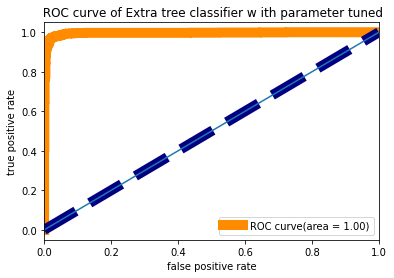

In [223]:
plt.figure()
plt.plot(fpr,tpr,color ="darkorange",lw = 10, label = "ROC curve(area = %0.2f)"%roc_auc)
plt.plot([0,1],[0,1]  , color = "navy" , lw = 10 ,  linestyle = "--" )
plt.xlim ([0.0 ,1.0] )
plt.plot([0.0 , 1.0])
plt.xlabel("false positive rate" )
plt.ylabel("true positive rate" )
plt.title (" ROC curve of Extra tree classifier w ith parameter tuned")
plt.legend(loc="lower right")


plt.show()

saving 

In [224]:
import pickle
filename = "rainfall.pkl"
pickle.dump(ext, open(filename,"wb"))